
# Objective

Creating  a deep learning model which can explain the contents of an image in the form of speech through caption generation with an attention mechanism on Flickr8K dataset.

## Techniques Used 
    1. Traditional VGG16 + LSTM model
    
    2. Traditional DenseNet + LSTM model

    3. Traditional Inception V3 + GRU model

    4. Attention model

    5. Text and Image preprocessing

    6. Model training and model evaluation

# Importing all the required libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

import tensorflow as tf
import keras
from keras.preprocessing.image import load_img
import string
import time
from sklearn.model_selection import train_test_split
from keras.preprocessing.text import Tokenizer

from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras import Input
from PIL import Image


from tqdm import tqdm
import os
import pickle
import numpy as np
from tqdm.notebook import tqdm

from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add

In [3]:
!pip install wordcloud
!pip install gtts
!pip install playsound

                                              0.0/151.4 kB ? eta -:--:--
     ----------                            41.0/151.4 kB 991.0 kB/s eta 0:00:01
     -----------------------------------    143.4/151.4 kB 1.7 MB/s eta 0:00:01
     -------------------------------------- 151.4/151.4 kB 1.5 MB/s eta 0:00:00



[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for playsound: filename=playsound-1.3.0-py3-none-any.whl size=7043 sha256=fbde9b024d94175d5eeaa2eb6cce824ad940cb12728980e92ba99c02d24ffa5c
  Stored in directory: c:\users\91701\appdata\local\pip\cache\wheels\50\98\42\62753a9e1fb97579a0ce2f84f7db4c21c09d03bb2091e6cef4
Successfully built playsound



[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
import glob
from gtts import gTTS
from playsound import playsound
from IPython import display

import collections
import wordcloud
from wordcloud import STOPWORDS

# Importing the dataset

In [6]:


import numpy as np
import pandas as pd


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/flickr8k/captions.txt

/kaggle/input/flickr8k/Images/3226254560_2f8ac147ea.jpg

/kaggle/input/flickr8k/Images/214543992_ce6c0d9f9b.jpg

/kaggle/input/flickr8k/Images/2366643786_9c9a830db8.jpg

/kaggle/input/flickr8k/Images/3368819708_0bfa0808f8.jpg

/kaggle/input/flickr8k/Images/2190227737_6e0bde2623.jpg

/kaggle/input/flickr8k/Images/2752809449_632cd991b3.jpg

/kaggle/input/flickr8k/Images/3097776588_312932e438.jpg

/kaggle/input/flickr8k/Images/1206506157_c7956accd5.jpg

/kaggle/input/flickr8k/Images/1319634306_816f21677f.jpg

/kaggle/input/flickr8k/Images/2465218087_fca77998c6.jpg

/kaggle/input/flickr8k/Images/3351493005_6e5030f596.jpg

/kaggle/input/flickr8k/Images/2949337912_beba55698b.jpg

/kaggle/input/flickr8k/Images/534886684_a6c9f40fa1.jpg

/kaggle/input/flickr8k/Images/3543600125_223747ef4c.jpg

/kaggle/input/flickr8k/Images/2174206711_11cb712a8d.jpg

/kaggle/input/flickr8k/Images/280706862_14c30d734a.jpg

/kaggle/input/flickr8k/Images/2100735137_05c6079537.jp

# Data Visualisation

1.Import the dataset and read image & captions into two seperate variables

2.Visualise both the images & text present in the dataset

3.Create a dataframe which summarizes the image, path & captions as a dataframe

4.Create a list which contains all the captions & path

5.Visualise the top 30 occuring words in the captions



## Importing the dataset and read image & captions into two separate variables

In [7]:


images='/kaggle/input/flickr8k/Images'

all_imgs = glob.glob(images + '/*.jpg',recursive=True)
print("The total images present in the dataset: {}".format(len(all_imgs)))

The total images present in the dataset: 8091


## Visualising the images and captions in the dataset

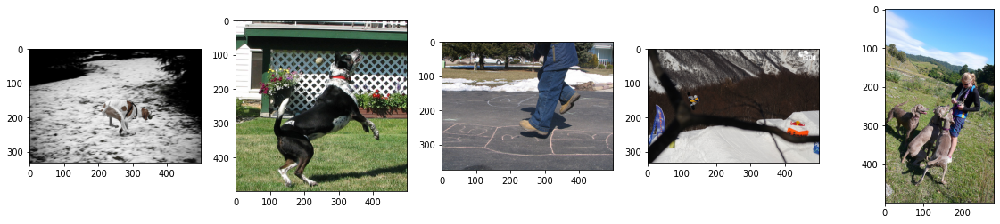

In [259]:

import imageio

#Visualising first 5 images :

Display_Images = all_imgs[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(20)

for ax, image in zip(axes, Display_Images):
  ax.imshow(imageio.imread(image), cmap=None)


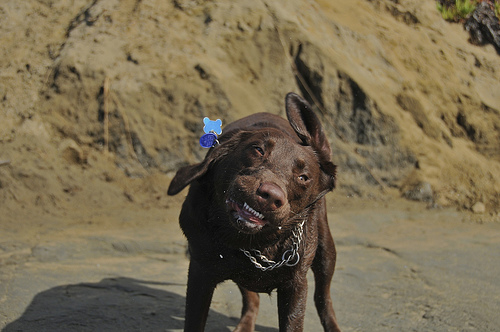

In [260]:
import random
Image.open(all_imgs[random.randrange(40, 60, 3)])

In [261]:
text_file = '/kaggle/input/flickr8k/captions.txt'

def load_doc(filename):
    open_file = open(text_file, 'r', encoding='latin-1' ) 
    text = open_file.read()
    open_file.close()
    return text

doc = load_doc(text_file)
print(doc[:300])

image,caption

1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .

1000268201_693b08cb0e.jpg,A girl going into a wooden building .

1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .

1000268201_693b08cb0e.jpg,A little girl climbing


##  Creating a dataframe which summarizes the image, path & captions as a dataframe (creating a mapping to the image path to the Caption)

    Create a dataframe which summarizes the image, path & captions as a dataframe

    Each image id has 5 captions associated with it therefore the total dataset should have 40455 samples.

## Creating a list which contains all the captions & path

#### We will create three lists here and finally combine them to form a dataframe

    1. all_img_id = [] to store all the image id 
    2. all_img_vector = [] to store all the image path 
    3. annotations = []  to store all the captions 

In [262]:
img_path = '/kaggle/input/flickr8k/Images/'

all_img_id = [] #store all the image id here
all_img_vector = [] #store all the image path here
annotations = [] #store all the captions here

with open('/kaggle/input/flickr8k/captions.txt' , 'r') as fo:
  next(fo) #to skip the heading
  for line in fo :
    split_arr = line.split(',')
    all_img_id.append(split_arr[0])
    annotations.append(split_arr[1].rstrip('\n.')) #removing out the \n.
    all_img_vector.append(img_path+split_arr[0])

df = pd.DataFrame(list(zip(all_img_id, all_img_vector,annotations)),columns =['ID','Path', 'Captions']) 
    
df

,ID,Path,Captions
0,1000268201_693b08cb0e.jpg,/kaggle/input/flickr8k/Images/1000268201_693b0...,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,/kaggle/input/flickr8k/Images/1000268201_693b0...,A girl going into a wooden building
2,1000268201_693b08cb0e.jpg,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl climbing into a wooden playhouse
3,1000268201_693b08cb0e.jpg,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl in a pink dress going into a woo...
...,...,...,...
40450,997722733_0cb5439472.jpg,/kaggle/input/flickr8k/Images/997722733_0cb543...,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,/kaggle/input/flickr8k/Images/997722733_0cb543...,A man is rock climbing high in the air
40452,997722733_0cb5439472.jpg,/kaggle/input/flickr8k/Images/997722733_0cb543...,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,/kaggle/input/flickr8k/Images/997722733_0cb543...,A rock climber in a red shirt


In [263]:
len (annotations)

40455

In [264]:
type (annotations)

list

   *Each image has 5 captions associated with it*
    
    Hence, total images : 8091
    
    Therefore, total captions : 8091*5 = 40455

In [265]:
print("Total captions present in the dataset: "+ str(len(annotations)))
print("Total images present in the dataset: " + str(len(all_imgs)))

Total captions present in the dataset: 40455

Total images present in the dataset: 8091


## Creating a vocabulary for the captions

In [266]:
vocabulary = [word.lower() for line in annotations for word in line.split()]
#lower() used to ensure same count irrespective of an alphabet's case

val_count = Counter(vocabulary) 
val_count

Counter({'a': 60196,
         'child': 1507,
         'in': 18174,
         'pink': 702,
         'dress': 332,
         'is': 9069,
         'climbing': 490,
         'up': 1215,
         'set': 105,
         'of': 6495,
         'stairs': 109,
         'an': 2325,
         'entry': 1,
         'way': 48,
         'girl': 3277,
         'going': 145,
         'into': 1046,
         'wooden': 278,
         'building': 485,
         'little': 1736,
         'playhouse': 6,
         'the': 17507,
         'to': 3005,
         'her': 1102,
         'cabin': 4,
         'black': 3620,
         'dog': 7948,
         'and': 8057,
         'spotted': 36,
         'are': 3365,
         'fighting': 130,
         'tri-colored': 12,
         'playing': 1954,
         'with': 7304,
         'each': 399,
         'other': 667,
         'on': 10357,
         'road': 380,
         'white': 3706,
         'brown': 2457,
         'spots': 28,
         'staring': 57,
         'at': 2810,
         'stree

## Visualising the top 30 occuring words in the captions

a :  60196

in :  18174

the :  17507

on :  10357

is :  9069

and :  8057

dog :  7948

with :  7304

man :  7137

of :  6495

two :  5132

white :  3706

black :  3620

boy :  3514

are :  3365

woman :  3304

girl :  3277

to :  3005

wearing :  2916

people :  2811

at :  2810

water :  2676

young :  2587

red :  2553

brown :  2457

an :  2325

his :  2255

blue :  2125

dogs :  2095

running :  1996


Text(0, 0.5, 'Count')

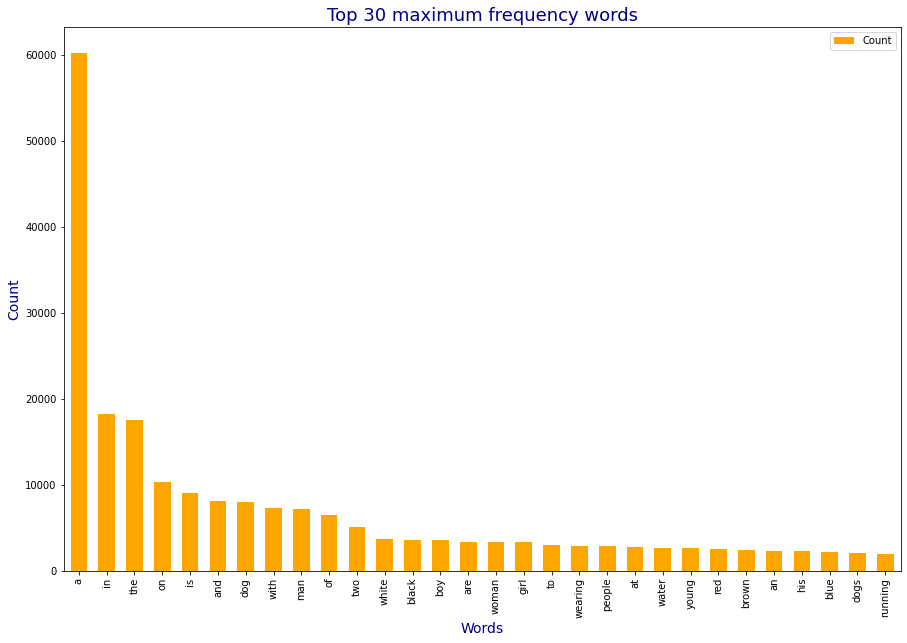

In [267]:
for word, count in val_count.most_common(30):
  print(word, ": ", count)

lst = val_count.most_common(30)
most_common_words_df = pd.DataFrame(lst, columns = ['Word', 'Count'])
most_common_words_df.plot.bar(x='Word', y='Count', width=0.6, color='green', figsize=(15, 10))
plt.title("Top 30 maximum frequency words", fontsize = 18, color= 'navy')
plt.xlabel("Words", fontsize = 14, color= 'navy')
plt.ylabel("Count", fontsize = 14, color= 'navy')


## Clearly STOPWORDS form a clear majority

**Stop words are a set of commonly used words in a language.**

  Examples of stop words in English are “a”, “the”, “is”, “are” and etc. 
    
*Stop words are commonly used in **Text Mining and Natural Language Processing (NLP)** to eliminate words that are so commonly used that they carry very little useful information.*

## Visualising the images and their captions together

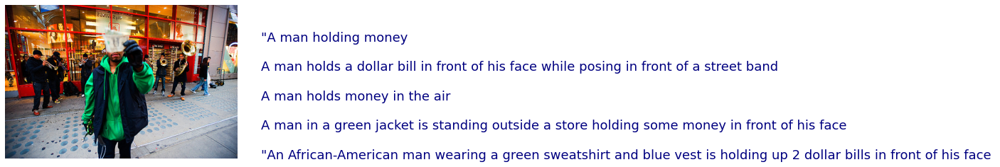

In [269]:
def caption_with_img_plot(image_id, frame) :
  capt = ("\n" *2).join(frame[frame['ID'] == image_id].Captions.to_list())
  fig, ax = plt.subplots()
  ax.set_axis_off()
  idx = df.ID.to_list().index(image_id)
  im =  Image.open(df.Path.iloc[idx])
  w, h = im.size[0], im.size[-1]
  ax.imshow(im)
  ax.text(w+50, h, capt, fontsize = 18, color = 'navy')
caption_with_img_plot(df.ID.iloc[8049], df)

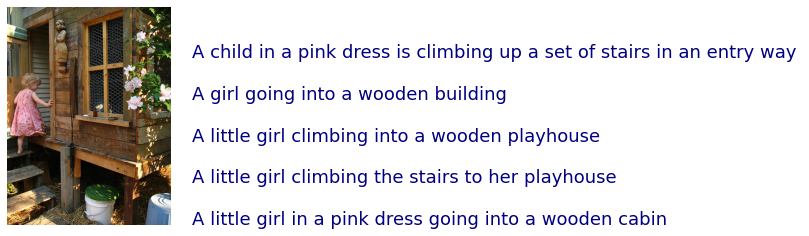

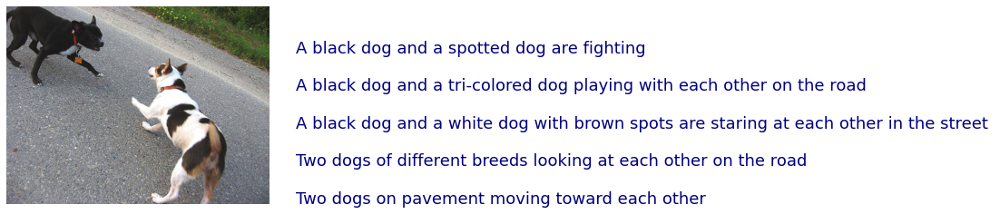

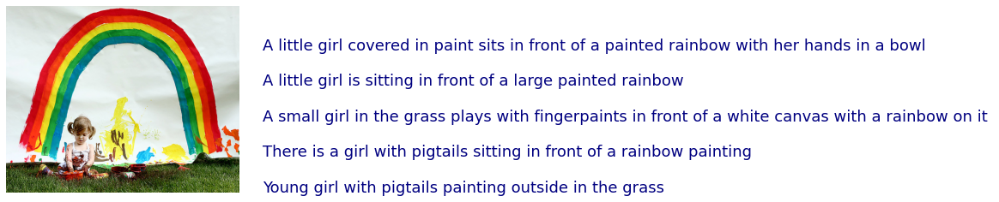

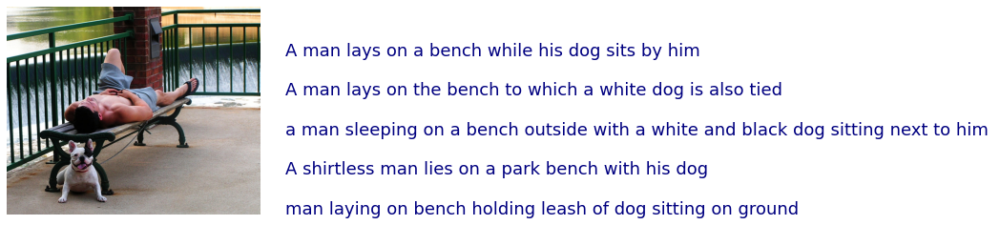

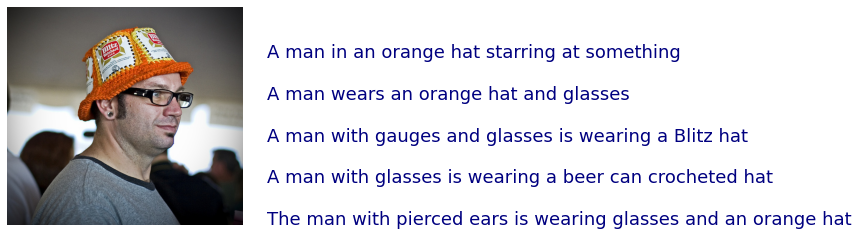

In [270]:
def execute_img_capt(start, end, frame) :
  for r in range(start, end) :
    caption_with_img_plot(frame.ID.drop_duplicates().iloc[r], frame)

execute_img_capt(0, 5, df)  

## Cleaning the Captions data

1. Remove punctuations
2. Convert captions to lowercase
3. Retain words and eliminate numeric values

In [271]:
rem_punct = str.maketrans('', '', string.punctuation)
for r in range(len(annotations)) :
  line = annotations[r]
  line = line.split()

  # converting to lowercase
  line = [word.lower() for word in line]

  # removing  punctuation from each caption and hanging letters
  line = [word.translate(rem_punct) for word in line]
  line = [word for word in line if len(word) > 1]

  # removing  numeric values
  line = [word for word in line if word.isalpha()]

  annotations[r] = ' '.join(line)

In [272]:
#add the <start> & <end> token to all those captions as well
annotations = ['<start>' + ' ' + line + ' ' + '<end>' for line in annotations]

#Create a list which contains all the path to the images
all_img_path = all_img_vector

In [273]:

annotations[0:5]

['<start> child in pink dress is climbing up set of stairs in an entry way <end>',
 '<start> girl going into wooden building <end>',
 '<start> little girl climbing into wooden playhouse <end>',
 '<start> little girl climbing the stairs to her playhouse <end>',
 '<start> little girl in pink dress going into wooden cabin <end>']

## Captions Preprocessing


Pre-Processing the captions

1. Create the tokenized vectors by tokenizing the captions fore ex :split them using spaces & other filters. 
This gives us a vocabulary of all of the unique words in the data. Keeping the total vocaublary to top 5,000 words for saving memory.

2. Replace all other words with the unknown token "UNK" .

3. Create word-to-index and index-to-word mappings.

4. Pad all sequences to be the same length as the longest one.

In [274]:
top_word_cnt = 5000
tokenizer = Tokenizer(num_words = top_word_cnt+1, filters= '!"#$%^&*()_+.,:;-?/~`{}[]|\=@ ',
                      lower = True, char_level = False, 
                      oov_token = 'UNK')

In [275]:
tokenizer.fit_on_texts(annotations)

train_seqs = tokenizer.texts_to_sequences(annotations)

### Padding

In [276]:
# we add PAD token for zero

tokenizer.word_index['PAD'] = 0
tokenizer.index_word[0] = 'PAD'

In [277]:
print(tokenizer.oov_token)
print(tokenizer.index_word[0])

UNK

PAD


#### View index words

In [278]:
tokenizer.index_word

{1: 'UNK',
 2: '<start>',
 3: '<end>',
 4: 'in',
 5: 'the',
 6: 'on',
 7: 'is',
 8: 'and',
 9: 'dog',
 10: 'with',
 11: 'man',
 12: 'of',
 13: 'two',
 14: 'white',
 15: 'black',
 16: 'boy',
 17: 'are',
 18: 'woman',
 19: 'girl',
 20: 'to',
 21: 'wearing',
 22: 'people',
 23: 'at',
 24: 'water',
 25: 'young',
 26: 'red',
 27: 'brown',
 28: 'an',
 29: 'his',
 30: 'blue',
 31: 'dogs',
 32: 'running',
 33: 'through',
 34: 'playing',
 35: 'while',
 36: 'down',
 37: 'little',
 38: 'shirt',
 39: 'standing',
 40: 'ball',
 41: 'grass',
 42: 'person',
 43: 'child',
 44: 'snow',
 45: 'jumping',
 46: 'over',
 47: 'three',
 48: 'front',
 49: 'sitting',
 50: 'small',
 51: 'field',
 52: 'up',
 53: 'holding',
 54: 'large',
 55: 'group',
 56: 'by',
 57: 'green',
 58: 'yellow',
 59: 'children',
 60: 'walking',
 61: 'men',
 62: 'her',
 63: 'into',
 64: 'beach',
 65: 'air',
 66: 'near',
 67: 'jumps',
 68: 'mouth',
 69: 'street',
 70: 'runs',
 71: 'for',
 72: 'another',
 73: 'riding',
 74: 'from',
 75: 'it

In [279]:
tokenizer_top_words = [word for line in annotations for word in line.split() ]
tokenizer_top_words_count = collections.Counter(tokenizer_top_words)
tokenizer_top_words_count

Counter({'<start>': 40455,
         'child': 1517,
         'in': 18182,
         'pink': 702,
         'dress': 332,
         'is': 9069,
         'climbing': 490,
         'up': 1215,
         'set': 105,
         'of': 6496,
         'stairs': 109,
         'an': 2358,
         'entry': 1,
         'way': 48,
         '<end>': 40455,
         'girl': 3284,
         'going': 145,
         'into': 1046,
         'wooden': 278,
         'building': 485,
         'little': 1750,
         'playhouse': 6,
         'the': 17676,
         'to': 3005,
         'her': 1102,
         'cabin': 4,
         'black': 3627,
         'dog': 7956,
         'and': 8057,
         'spotted': 36,
         'are': 3365,
         'fighting': 130,
         'tricolored': 12,
         'playing': 1954,
         'with': 7308,
         'each': 399,
         'other': 667,
         'on': 10367,
         'road': 380,
         'white': 3710,
         'brown': 2471,
         'spots': 28,
         'staring': 57,
      

<start> :  40455

<end> :  40455

in :  18182

the :  17676

on :  10367

is :  9069

and :  8057

dog :  7956

with :  7308

man :  7164

of :  6496

two :  5546

white :  3710

black :  3627

boy :  3534

are :  3365

woman :  3320

girl :  3284

to :  3005

wearing :  2917

people :  2837

at :  2819

water :  2676

young :  2610

red :  2553

brown :  2471

an :  2358

his :  2255

blue :  2125

dogs :  2097


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.

  if sys.path[0] == '':


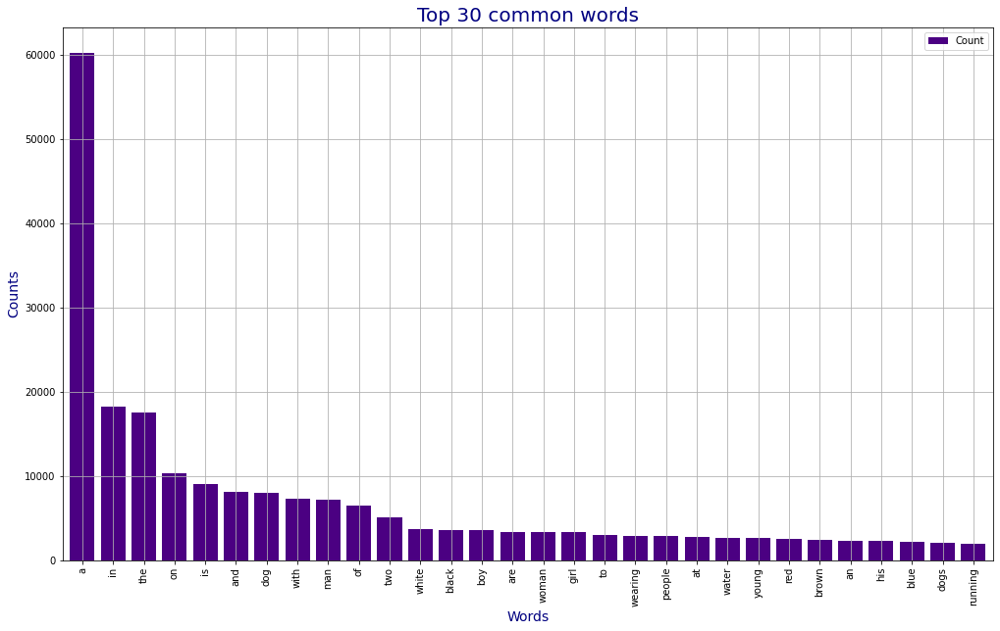

In [280]:
for word, count in tokenizer_top_words_count.most_common(30) :
  print(word, ": ", count)

tokens = tokenizer_top_words_count.most_common(30)
most_com_words_df = pd.DataFrame(tokens, columns = ['Word', 'Count'])

#plot 30 most common words
most_common_words_df.plot.bar(x = 'Word', y= 'Count', width=0.8, color = 'indigo', figsize = (17, 10))
plt.title('Top 30 common words', fontsize =20, color= 'navy')
plt.xlabel('Words', fontsize =14, color= 'navy')
plt.ylabel('Counts', fontsize =14, color= 'navy')
plt.grid(b=None)

In [282]:

train_seqs_len = [len(seq) for seq in train_seqs]


longest_word_length = max(train_seqs_len)


cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding= 'post', maxlen = longest_word_length,
                                                          dtype='int32', value=0)

print("The shape of Caption vector is :" + str(cap_vector.shape))

The shape of Caption vector is :(40455, 31)


**NOTE :** Using padding = 'post', we are padding zero at last. Starting word always acts as a crucial prompter and another word is expected after that. Zero at the beginning would indicate no value.

Hence in order to maintain existing sequence and it's meaning, we **apply PADDING at the end.**

## 4.2 Pre-processing the images

1.Resize them into the shape of (299, 299)

2.Normalize the image within the range of -1 to 1, such that it is in correct format for InceptionV3. 

### FAQs on how to resize the images::
* Since you have a list which contains all the image path, you need to first convert them to a dataset using <i>tf.data.Dataset.from_tensor_slices</i>. Once you have created a dataset consisting of image paths, you need to apply a function to the dataset which will apply the necessary preprocessing to each image. 
* This function should resize them and also should do the necessary preprocessing that it is in correct format for InceptionV3.


In [283]:

preprocessed_image = []
IMAGE_SHAPE = (299, 299)

In [284]:

tf.keras.backend.image_data_format()

'channels_last'

**Image data format = 'channels_last' indicates Image is in three dimensional array, where third dim represents color channels (RGB)**

1st dim = rows

2nd dim = columns

3rd dim = channels 

In [285]:

for img in all_imgs[0:5] :
    img = tf.io.read_file(img, name=None)

    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)

    #append preprocessed images to the list
    preprocessed_image.append(img)

Shape after resize :  (299, 299, 3)

Shape after resize :  (299, 299, 3)

Shape after resize :  (299, 299, 3)

Shape after resize :  (299, 299, 3)

Shape after resize :  (299, 299, 3)


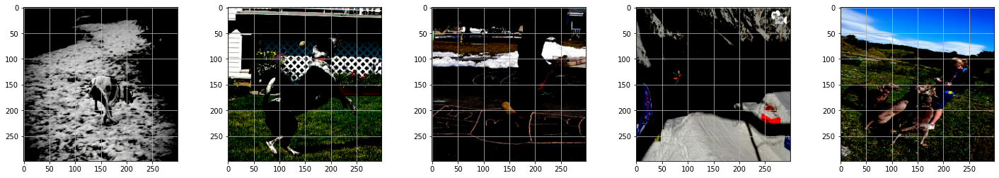

In [286]:


Display_Images = preprocessed_image[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(25)

for ax, image in zip(axes, Display_Images) :
  print('Shape after resize : ', image.shape)
  ax.imshow(image)
  ax.grid('off')

# Dataset Creation

1.Create a function which maps the image path to their feature.

2.Create a builder function to create train & test dataset & apply the function created earlier to transform the dataset

3.Apply train_test_split on both image path & captions to create the train & test list. Create the train-test spliit using 80-20 ratio & random state = 42

2.Make sure you have done Shuffle and batch while building the dataset

3.The shape of each image in the dataset after building should be (batch_size, 8*8, 2048)

4.The shape of each caption in the dataset after building should be(batch_size, max_len)

**We will have a function here for preprocessing and returing images, so that we can use it for vectorization and preprocesses images parallelly**

In [ ]:
def load_images(image_path) :
  img = tf.io.read_file(image_path, name = None)
  img = tf.image.decode_jpeg(img, channels=0)
  img = tf.image.resize(img, IMAGE_SHAPE)
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  return img, image_path

In [288]:
all_img_vector

['/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
 '/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
 '/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
 '/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
 '/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
 '/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
 '/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
 '/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
 '/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
 '/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
 '/kaggle/input/flickr8k/Images/1002674143_1b742ab4b8.jpg',
 '/kaggle/input/flickr8k/Images/1002674143_1b742ab4b8.jpg',
 '/kaggle/input/flickr8k/Images/1002674143_1b742ab4b8.jpg',
 '/kaggle/input/flickr8k/Images/1002674143_1b742ab4b8.jpg',
 '/kaggle/input/flickr8k/Images/1002674143_1b742ab4b8.jpg',
 '/kaggle/input/flickr8k/Images/1003163366_44323f5815.jpg',
 '/kaggle/input/flickr8k/Images/10031633

______


# Using a DenseNet + LSTM Model (without Attention)

In [94]:
data = pd.read_csv("../input/flickr8k/captions.txt")
data.head()

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [97]:
from textwrap import wrap
def readImage(path,img_size=224):
    img = load_img(path,color_mode='rgb',target_size=(img_size,img_size))
    img = img_to_array(img)
    img = img/255.
    
    return img

def display_images(temp_df):
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(15):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.7, wspace = 0.3)
        image = readImage(f"../input/flickr8k/Images/{temp_df.image[i]}")
        plt.imshow(image)
        plt.title("\n".join(wrap(temp_df.caption[i], 20)))
        plt.axis("off")

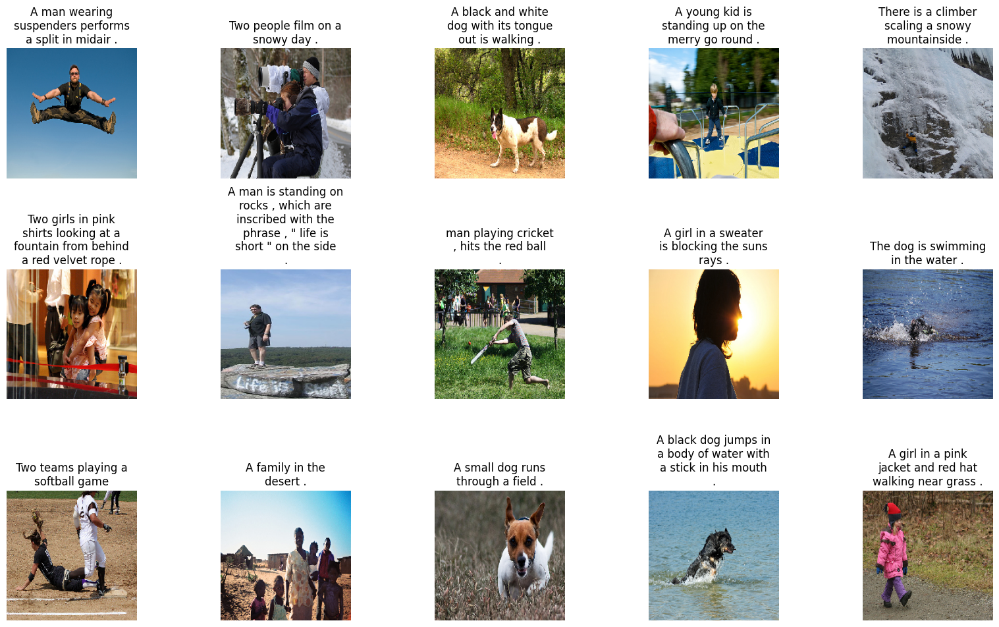

In [98]:
display_images(data.sample(15))

In [99]:
def text_preprocessing(data):
    data['caption'] = data['caption'].apply(lambda x: x.lower())
    data['caption'] = data['caption'].apply(lambda x: x.replace("[^A-Za-z]",""))
    data['caption'] = data['caption'].apply(lambda x: x.replace("\s+"," "))
    data['caption'] = data['caption'].apply(lambda x: " ".join([word for word in x.split() if len(word)>1]))
    data['caption'] = "startseq "+data['caption']+" endseq"
    return data

In [100]:
data = text_preprocessing(data)
captions = data['caption'].tolist()
captions[:10]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq',
 'startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tri-colored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq']

In [101]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(captions)
vocab_size = len(tokenizer.word_index) + 1
max_length = max(len(caption.split()) for caption in captions)

images = data['image'].unique().tolist()
nimages = len(images)

split_index = round(0.85*nimages)
train_images = images[:split_index]
val_images = images[split_index:]

train = data[data['image'].isin(train_images)]
test = data[data['image'].isin(val_images)]

train.reset_index(inplace=True,drop=True)
test.reset_index(inplace=True,drop=True)

tokenizer.texts_to_sequences([captions[1]])[0]

[1, 18, 315, 63, 195, 116, 2]

In [107]:
from tensorflow.keras.applications import DenseNet201
image_path = '../input/flickr8k/Images'
model = DenseNet201()
fe = Model(inputs=model.input, outputs=model.layers[-2].output)

img_size = 224
features = {}
for image in tqdm(data['image'].unique().tolist()):
    img = load_img(os.path.join(image_path,image),target_size=(img_size,img_size))
    img = img_to_array(img)
    img = img/255.
    img = np.expand_dims(img,axis=0)
    feature = fe.predict(img, verbose=0)
    features[image] = feature

  0%|          | 0/8091 [00:00<?, ?it/s]

In [109]:
from tensorflow.keras.utils import Sequence
class CustomDataGenerator(Sequence):
    
    def __init__(self, df, X_col, y_col, batch_size, directory, tokenizer, 
                 vocab_size, max_length, features,shuffle=True):
    
        self.df = df.copy()
        self.X_col = X_col
        self.y_col = y_col
        self.directory = directory
        self.batch_size = batch_size
        self.tokenizer = tokenizer
        self.vocab_size = vocab_size
        self.max_length = max_length
        self.features = features
        self.shuffle = shuffle
        self.n = len(self.df)
        
    def on_epoch_end(self):
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)
    
    def __len__(self):
        return self.n // self.batch_size
    
    def __getitem__(self,index):
    
        batch = self.df.iloc[index * self.batch_size:(index + 1) * self.batch_size,:]
        X1, X2, y = self.__get_data(batch)        
        return (X1, X2), y
    
    def __get_data(self,batch):
        
        X1, X2, y = list(), list(), list()
        
        images = batch[self.X_col].tolist()
           
        for image in images:
            feature = self.features[image][0]
            
            captions = batch.loc[batch[self.X_col]==image, self.y_col].tolist()
            for caption in captions:
                seq = self.tokenizer.texts_to_sequences([caption])[0]

                for i in range(1,len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=self.max_length)[0]
                    out_seq = to_categorical([out_seq], num_classes=self.vocab_size)[0]
                    X1.append(feature)
                    X2.append(in_seq)
                    y.append(out_seq)
            
        X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                
        return X1, X2, y

In [112]:
from tensorflow.keras.layers import Reshape,concatenate, Bidirectional
input1 = Input(shape=(1920,))
input2 = Input(shape=(max_length,))

img_features = Dense(256, activation='relu')(input1)
img_features_reshaped = Reshape((1, 256), input_shape=(256,))(img_features)

sentence_features = Embedding(vocab_size, 256, mask_zero=False)(input2)
merged = concatenate([img_features_reshaped,sentence_features],axis=1)
sentence_features = LSTM(256)(merged)
x = Dropout(0.5)(sentence_features)
x = add([x, img_features])
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(vocab_size, activation='softmax')(x)

caption_model = Model(inputs=[input1,input2], outputs=output)
caption_model.compile(loss='categorical_crossentropy',optimizer='adam')

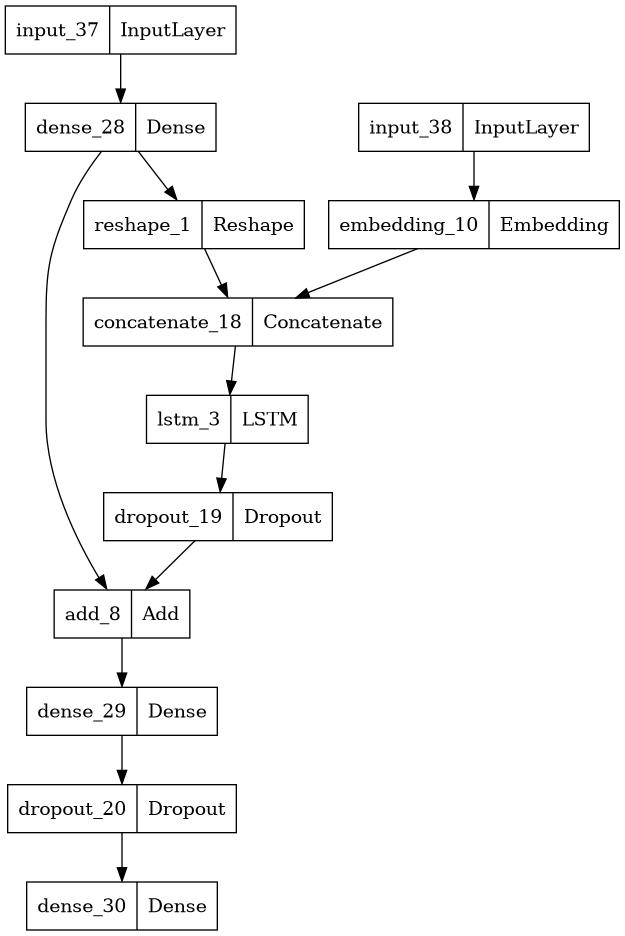

In [113]:
plot_model(caption_model)

In [114]:
caption_model.summary()

Model: "model_16"

__________________________________________________________________________________________________

 Layer (type)                Output Shape                 Param #   Connected to                  


 input_37 (InputLayer)       [(None, 1920)]               0         []                            

                                                                                                  

 dense_28 (Dense)            (None, 256)                  491776    ['input_37[0][0]']            

                                                                                                  

 input_38 (InputLayer)       [(None, 34)]                 0         []                            

                                                                                                  

 reshape_1 (Reshape)         (None, 1, 256)               0         ['dense_28[0][0]']            

                                                                                

In [115]:
train_generator = CustomDataGenerator(df=train,X_col='image',y_col='caption',batch_size=64,directory=image_path,
                                      tokenizer=tokenizer,vocab_size=vocab_size,max_length=max_length,features=features)

validation_generator = CustomDataGenerator(df=test,X_col='image',y_col='caption',batch_size=64,directory=image_path,
                                      tokenizer=tokenizer,vocab_size=vocab_size,max_length=max_length,features=features)

In [117]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
model_name = "dense_net_model.h5"
checkpoint = ModelCheckpoint(model_name,
                            monitor="val_loss",
                            mode="min",
                            save_best_only = True,
                            verbose=1)

earlystopping = EarlyStopping(monitor='val_loss',min_delta = 0, patience = 5, verbose = 1, restore_best_weights=True)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.2, 
                                            min_lr=0.00000001)

In [118]:
history = caption_model.fit(
        train_generator,
        epochs=50,
        validation_data=validation_generator,
        callbacks=[checkpoint,earlystopping,learning_rate_reduction])

Epoch 1/50

537/537 [==============================] - ETA: 0s - loss: 5.1801

Epoch 1: val_loss improved from inf to 4.26774, saving model to dense_net_model.h5

537/537 [==============================] - 228s 414ms/step - loss: 5.1801 - val_loss: 4.2677 - lr: 0.0010

Epoch 2/50


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

  saving_api.save_model(


537/537 [==============================] - ETA: 0s - loss: 4.2131

Epoch 2: val_loss improved from 4.26774 to 3.94411, saving model to dense_net_model.h5

537/537 [==============================] - 53s 98ms/step - loss: 4.2131 - val_loss: 3.9441 - lr: 0.0010

Epoch 3/50

537/537 [==============================] - ETA: 0s - loss: 3.9404

Epoch 3: val_loss improved from 3.94411 to 3.78316, saving model to dense_net_model.h5

537/537 [==============================] - 47s 88ms/step - loss: 3.9404 - val_loss: 3.7832 - lr: 0.0010

Epoch 4/50

537/537 [==============================] - ETA: 0s - loss: 3.7710

Epoch 4: val_loss improved from 3.78316 to 3.71115, saving model to dense_net_model.h5

537/537 [==============================] - 47s 88ms/step - loss: 3.7710 - val_loss: 3.7112 - lr: 0.0010

Epoch 5/50

537/537 [==============================] - ETA: 0s - loss: 3.6490

Epoch 5: val_loss improved from 3.71115 to 3.64986, saving model to dense_net_model.h5

537/537 [====================

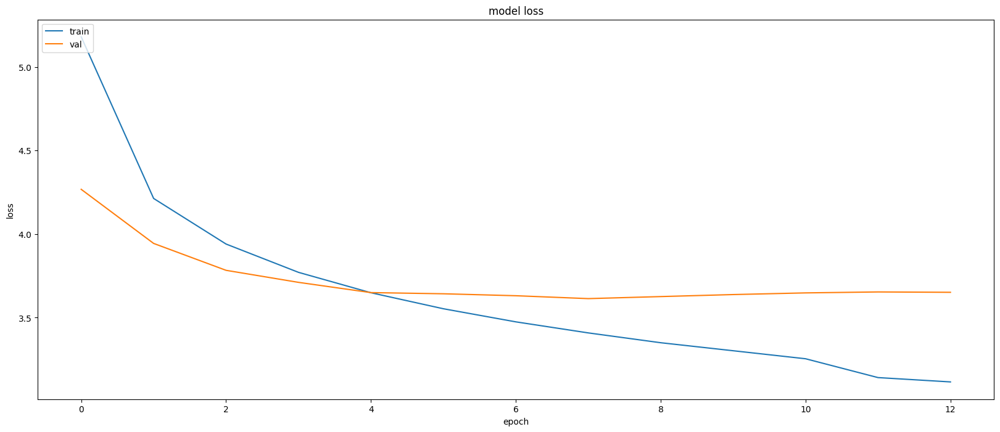

In [119]:
plt.figure(figsize=(20,8))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [120]:
def idx_to_word(integer,tokenizer):
    
    for word, index in tokenizer.word_index.items():
        if index==integer:
            return word
    return None

In [121]:
def predict_caption(model, image, tokenizer, max_length, features):
    
    feature = features[image]
    in_text = "startseq"
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], max_length)

        y_pred = model.predict([feature,sequence])
        y_pred = np.argmax(y_pred)
        
        word = idx_to_word(y_pred, tokenizer)
        
        if word is None:
            break
            
        in_text+= " " + word
        
        if word == 'endseq':
            break
            
    return in_text

In [122]:
samples = test.sample(15)
samples.reset_index(drop=True,inplace=True)

In [123]:
for index,record in samples.iterrows():

    img = load_img(os.path.join(image_path,record['image']),target_size=(224,224))
    img = img_to_array(img)
    img = img/255.
    
    caption = predict_caption(caption_model, record['image'], tokenizer, max_length, features)
    samples.loc[index,'caption'] = caption

1/1 [==============================] - 0s 444ms/step

1/1 [==============================] - 0s 23ms/step

1/1 [==============================] - 0s 22ms/step

1/1 [==============================] - 0s 23ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 22ms/step

1/1 [==============================] - 0s 23ms/step

1/1 [==============================] - 0s 23ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 22ms/step

1/1 [==============================] - 0s 23ms/step

1/1 [==============================] - 0s 23ms/step

1/1 [==============================] - 0s 22ms/step

1/1 [==============================] - 0s 22ms/step

1/1 [==============================] - 0s 22ms/step

1/1 [==============================] - 0s 22ms/step

1/1 [==============================] - 0s 22ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 21m

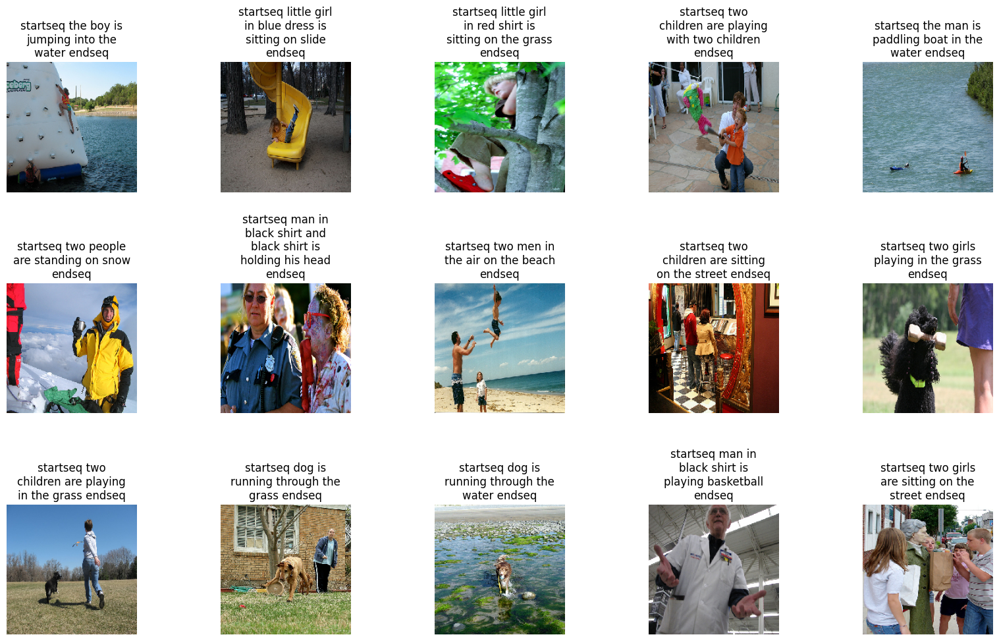

In [124]:
display_images(samples)

In [125]:

caption_model.save("/kaggle/working/"+'/model_densenet_lstm.h5')

_______


# Using a VGG16 + LSTM Model (without Attention)

________________

In [2]:

model = VGG16()

model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

print(model.summary())

Model: "model"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         

                                                                 

 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      

                                                                 

 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     

                                                                 

 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         

                                                                 

 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     

                                                                 

 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    

                                                                 

 block2_pool (MaxPooling2D)  (None, 56, 56, 1

In [3]:

features = {}
directory = "/kaggle/input/flickr8k/Images"

for img_name in tqdm(os.listdir(directory)):
 
    img_path = directory + '/' + img_name
    image = load_img(img_path, target_size=(224, 224))
    image = img_to_array(image)
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    feature = model.predict(image, verbose=0)
    image_id = img_name.split('.')[0]

    features[image_id] = feature

  0%|          | 0/8091 [00:00<?, ?it/s]

In [4]:

pickle.dump(features, open(os.path.join("/kaggle/working/", 'features_vgg_lstm.pkl'), 'wb'))

In [5]:

with open(os.path.join("/kaggle/working/", 'features_vgg_lstm.pkl'), 'rb') as f:
    features = pickle.load(f)

# Loading the captions data

In [6]:
with open("/kaggle/input/flickr8k/captions.txt", 'r') as f:
    next(f)
    captions_doc = f.read()

In [7]:

mapping = {}

for line in tqdm(captions_doc.split('\n')):
    
    tokens = line.split(',')
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    image_id = image_id.split('.')[0]
    caption = " ".join(caption)
    if image_id not in mapping:
        mapping[image_id] = []
    mapping[image_id].append(caption)

  0%|          | 0/40456 [00:00<?, ?it/s]

# Preprocessing the Data

In [8]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
           
            caption = captions[i]
    
            
            caption = caption.lower() 
            caption = caption.replace('[^A-Za-z]', '')
            
            caption = caption.replace('\s+', ' ')
            
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
            captions[i] = caption

In [9]:
# before preprocess of text
mapping['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [10]:
# preprocess the text
clean(mapping)

In [12]:
# after preprocess of text
mapping['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

In [13]:
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [14]:
len(all_captions)

40455

In [15]:
all_captions[:10]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq',
 'startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tri-colored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq']

In [16]:
# tokenize the text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index) + 1

In [17]:
vocab_size

8485

In [18]:
# get maximum length of the caption available
max_length = max(len(caption.split()) for caption in all_captions)
max_length

35

# Train test Split

In [19]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
test = image_ids[split:]

In [180]:
# startseq girl going into wooden building endseq
#        X                   y
# startseq                   girl
# startseq girl              going
# startseq girl going        into
# ...........
# startseq girl going into wooden building      endseq

In [20]:
# create data generator to get data in batch (avoids session crash)
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    # loop over images
    X1, X2, y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n += 1
            captions = mapping[key]
            # process each caption
            for caption in captions:
                # encode the sequence
                seq = tokenizer.texts_to_sequences([caption])[0]
                # split the sequence into X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pairs
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    
                    # store the sequences
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size:
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0

# Model Creation

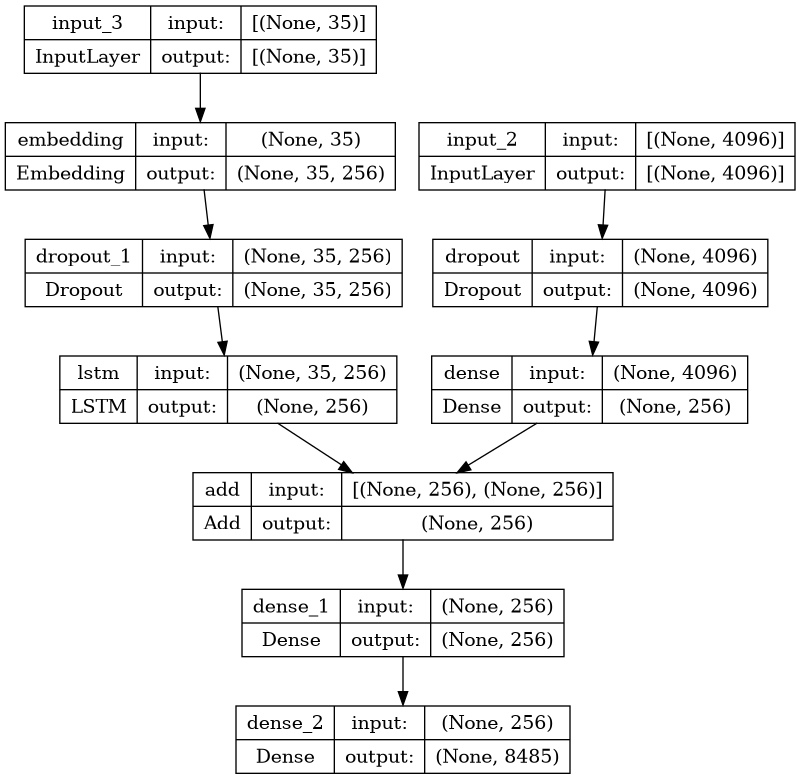

In [21]:
# encoder model
# image feature layers
inputs1 = Input(shape=(4096,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
# sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)

# decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam')

# plot the model
plot_model(model, show_shapes=True)

227/227 [==============================] - 58s 253ms/step - loss: 5.1127

227/227 [==============================] - 43s 190ms/step - loss: 3.9922

227/227 [==============================] - 43s 188ms/step - loss: 3.5721

227/227 [==============================] - 43s 190ms/step - loss: 3.3059

227/227 [==============================] - 43s 190ms/step - loss: 3.1106

227/227 [==============================] - 43s 191ms/step - loss: 2.9596

227/227 [==============================] - 42s 186ms/step - loss: 2.8434

227/227 [==============================] - 43s 189ms/step - loss: 2.7501

227/227 [==============================] - 43s 187ms/step - loss: 2.6748

227/227 [==============================] - 41s 180ms/step - loss: 2.6064

227/227 [==============================] - 42s 186ms/step - loss: 2.5440

227/227 [==============================] - 42s 184ms/step - loss: 2.4899

227/227 [==============================] - 43s 189ms/step - loss: 2.4382

227/227 [=============================

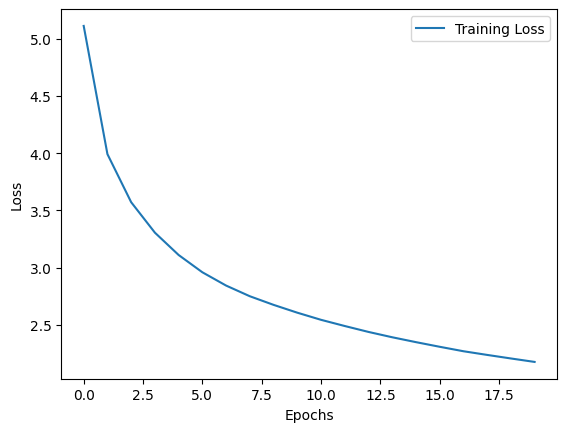

In [38]:
# # train the model
# epochs = 20
# batch_size = 32
# steps = len(train) // batch_size

# for i in range(epochs):
#     # create data generator
#     generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
#     # fit for one epoch
#     model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)

import matplotlib.pyplot as plt

# Lists to store training loss values
loss_values = []

# Train the model
epochs = 20
batch_size = 32
steps = len(train) // batch_size

for i in range(epochs):
    # create data generator
    generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # fit for one epoch
    history = model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    
    # Append the loss value to the list
    loss_values.append(history.history['loss'][0])

# Plot the training loss
plt.plot(loss_values, label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [39]:

model.save("/kaggle/working/"+'/model_vgg_lstm.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

  saving_api.save_model(


In [40]:
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

In [41]:
# generate caption for an image
def predict_caption(model, image, tokenizer, max_length):
    # add start tag for generation process
    in_text = 'startseq'
    # iterate over the max length of sequence
    for i in range(max_length):
      
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], max_length)
        yhat = model.predict([image, sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = idx_to_word(yhat, tokenizer)
        if word is None:
            break
       
        in_text += " " + word
        
        if word == 'endseq':
            break
      
    return in_text

In [42]:
from nltk.translate.bleu_score import corpus_bleu

actual, predicted = list(), list()

for key in tqdm(test):
   
    captions = mapping[key]
  
    y_pred = predict_caption(model, features[key], tokenizer, max_length) 
   
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    
    actual.append(actual_captions)
    predicted.append(y_pred)
    
# BLEU score
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))

  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1: 0.533187

BLEU-2: 0.309848


In [43]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
   
    image_id = image_name.split('.')[0]
    img_path = os.path.join("/kaggle/input/flickr8k/Images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------Actual---------------------')
    for caption in captions:
        print(caption)
    # predicting  the caption
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print('--------------------Predicted--------------------')
    print(y_pred)
    plt.imshow(image)

---------------------Actual---------------------

startseq black dog and spotted dog are fighting endseq

startseq black dog and tri-colored dog playing with each other on the road endseq

startseq black dog and white dog with brown spots are staring at each other in the street endseq

startseq two dogs of different breeds looking at each other on the road endseq

startseq two dogs on pavement moving toward each other endseq

--------------------Predicted--------------------

startseq two dogs are playing with each other on the sidewalk endseq


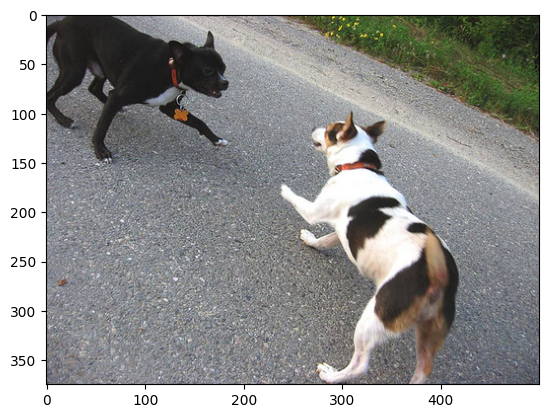

In [44]:
generate_caption("1001773457_577c3a7d70.jpg")

---------------------Actual---------------------

startseq little girl covered in paint sits in front of painted rainbow with her hands in bowl endseq

startseq little girl is sitting in front of large painted rainbow endseq

startseq small girl in the grass plays with fingerpaints in front of white canvas with rainbow on it endseq

startseq there is girl with pigtails sitting in front of rainbow painting endseq

startseq young girl with pigtails painting outside in the grass endseq

--------------------Predicted--------------------

startseq two little girls are sitting in the grass with rainbow in the air endseq


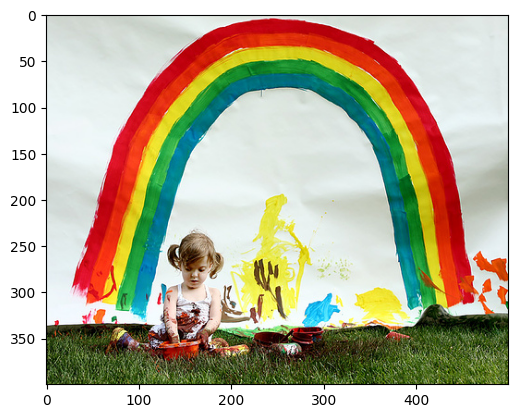

In [45]:
generate_caption("1002674143_1b742ab4b8.jpg")

In [46]:
pickle.dump(tokenizer, open(os.path.join("/kaggle/working/", 'tokenizer_vgg_lstm.pkl'), 'wb'))

_____

______

 # Inception V3 + GRU (With attention)

In [289]:
# Map each image full path to the function, in order to preprocess the image

## sort the unique paths and store in a list
training_list = sorted(set(all_img_vector))

#create a new dataset from above training list
New_Img = tf.data.Dataset.from_tensor_slices(training_list)

#map load_images function across the elements of the new dataset above
New_Img = New_Img.map(load_images, num_parallel_calls = tf.data.experimental.AUTOTUNE)
#Note  : Here, num_parallel_calls = tf.data.experimental.AUTOTUNE sets the number of parallel calls dynamically.
            ## based on the current GPU/CPU
        ##[(img,image_path),(img,image_path),..........]

#setting a batch size of 64
New_Img = New_Img.batch(64, drop_remainder=False)
#Note : As we don't want to drop the last batch if it contains less than 64 elements, we set drop_remainder to false

**Note :** As we didn't want to drop the last batch if it contains less than 64 elements, we **set drop_remainder to false**

In [290]:
New_Img

<BatchDataset shapes: ((None, 299, 299, None), (None,)), types: (tf.float32, tf.string)>

### Train-test split

    Split ratio = 80 : 20

    Rabdom state = 42

In [291]:
path_train, path_test, caption_train, caption_test = train_test_split(all_img_vector, cap_vector, test_size = 0.2, random_state = 42)

In [292]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(caption_train)))
print("Testing data for Captions: " + str(len(caption_test)))

Training data for images: 32364

Testing data for images: 8091

Training data for Captions: 32364

Testing data for Captions: 8091


### Load the pretrained Imagenet weights of Inception net V3


    1.To save the memory(RAM) from getting exhausted, extract the features of the images using the last layer of pre-trained model. Including this as part of training will lead to higher computational time.

    2.The shape of the output of this layer is 8x8x2048. 

    3.Use a function to extract the features of each image in the train & test dataset such that the shape of each image should be (batch_size, 8*8, 2048)



In [68]:
image_model = tf.keras.applications.InceptionV3(include_top=False,weights='imagenet')

new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)


87910968/87910968 [==============================] - 0s 0us/step


In [294]:
image_features_extract_model.summary()

Model: "model"

__________________________________________________________________________________________________

Layer (type)                    Output Shape         Param #     Connected to                     


input_19 (InputLayer)           [(None, None, None,  0                                            

__________________________________________________________________________________________________

conv2d (Conv2D)                 (None, None, None, 3 864         input_19[0][0]                   

__________________________________________________________________________________________________

batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     

__________________________________________________________________________________________________

activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        

___________________________________________________________________________________

### NOTE : As we are not classifying the images here, there is no need to have the softmax layer at the end.

In [295]:
# extract features from each image in the dataset

img_features = {}
for image, image_path in tqdm(New_Img) :

  # feed images from newly created Dataset above to Inception V3 built above
  batch_features = image_features_extract_model(image)
  #squeeze out the features in a batch
  batch_features_flattened = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))

  for batch_feat, path in zip(batch_features_flattened, image_path) :
    feature_path = path.numpy().decode('utf-8')
    img_features[feature_path] = batch_feat.numpy()

  0%|          | 0/127 [00:00<?, ?it/s]

In [296]:
batch_features

<tf.Tensor: shape=(27, 8, 8, 2048), dtype=float32, numpy=
array([[[[0.00000000e+00, 7.73590952e-02, 0.00000000e+00, ...,
          2.31990203e-01, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          1.07845321e-01, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 1.94018483e-01, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 1.85825527e-01],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          9.42283124e-02, 0.00000000e+00, 5.05860507e-01],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 4.23104107e-01, 1.33328093e-02, ...,
          2.33793616e-01, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         

In [297]:
batch_features_flattened

<tf.Tensor: shape=(27, 64, 2048), dtype=float32, numpy=
array([[[0.0000000e+00, 7.7359095e-02, 0.0000000e+00, ...,
         2.3199020e-01, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.0784532e-01, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 1.9401848e-01, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 1.8582553e-01],
        ...,
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 1.6567849e+00, 0.0000000e+00],
        [0.0000000e+00, 4.0278664e-01, 0.0000000e+00, ...,
         0.0000000e+00, 3.1788370e-01, 0.0000000e+00],
        [0.0000000e+00, 2.5347657e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

       [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.2506980e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 7.8535922e-02, ...,
         1.2066435e+00, 0.0000000e+00, 0.0000000e+00],
        [0.000000

In [298]:
len(img_features)

8091

In [299]:
batch_feat.shape

TensorShape([64, 2048])

In [300]:
#view top five items of img_features dict
import more_itertools
top_5 = more_itertools.take(5, img_features.items())

top_5

[('/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
  array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.        ],
         [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.16986306],
         [0.        , 0.        , 1.010446  , ..., 0.        , 0.        ,
          0.06114799],
         ...,
         [0.        , 0.        , 2.0381377 , ..., 1.2029498 , 0.        ,
          1.9928185 ],
         [0.        , 0.        , 0.90437955, ..., 0.        , 0.        ,
          0.        ],
         [0.        , 1.2523375 , 0.        , ..., 0.        , 0.        ,
          0.        ]], dtype=float32)),
 ('/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
  array([[0.        , 0.663682  , 0.4629718 , ..., 0.        , 0.        ,
          3.3317509 ],
         [0.        , 1.2268479 , 0.        , ..., 0.        , 0.2535765 ,
          3.328985  ],
         [1.2880698 , 1.5194613 , 0.        , ..., 0.46770248,

In [301]:
#to provide, both images along with the captions as input
def map(image_name, caption):
    img_tensor = img_features[image_name.decode('utf-8')]
    return img_tensor, caption

#### We will set the bufffer size to 1000 and batch size to 64

    In Tensorflow, data is designed to work with huge sequences. Thus instead of shuffling entire sequence, it maintains separate buffer within which it shuffles elements. This buffer size of 1000 refers to the same.
    
    
    We will set reshuffle_each_iteration to True in order to ensure different order per epoch
    
    We will also use the prefetch function to prepare later elements as the current ones are being processed


In [302]:
# create a builder function to create dataset which takes in the image path & captions as input
# This function should transform the created dataset(img_path,cap) to (features,cap) using the map_func created earlier

BUFFER_SIZE = 1000
BATCH_SIZE = 64
def gen_dataset(img, capt):    
    data = tf.data.Dataset.from_tensor_slices((img, capt))
    # dataset created using tf.data.Dataset.from_tensor_slices
    data = data.map(lambda ele1, ele2 : tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls = tf.data.experimental.AUTOTUNE) 
    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration= True).batch(BATCH_SIZE, drop_remainder = False)
    .prefetch(tf.data.experimental.AUTOTUNE))
    # .prefetch() is used to prepare all upcoming elements, while current elements are being processed
    # We set reshuffle_each_iteration set to True in order to ensure different order per epoch
    # Also,  drop_remainder is set to False as we don't want to miss out any element if the last batch contains less than 64 elements
    return data

In [303]:
train_dataset = gen_dataset(path_train,caption_train)
test_dataset = gen_dataset(path_test,caption_test)

In [304]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape) #(batch_size,max_len)

(64, 64, 2048)

(64, 31)


# Model Building

    1. Set the parameters

    2. Build the Encoder

    3. Build the Attention Model

    4. Build the Decoder

In [305]:
# Setting  parameters

embedding_dim = 256 
units = 512

#top 5,000 words +1
vocab_size = 5001
train_num_steps = len(path_train) // BATCH_SIZE #len(total train images) // BATCH_SIZE
test_num_steps = len(path_test) // BATCH_SIZE  #len(total test images) // BATCH_SIZE

max_length = 31
feature_shape = batch_feat.shape[1]
attention_feature_shape = batch_feat.shape[0]

## Encoder (CNN)

In [306]:
tf.compat.v1.reset_default_graph()
print(tf.compat.v1.get_default_graph())

In [307]:
#Building Encoder using CNN Keras subclassing method

class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) #build your Dense layer with relu activation
        
    def call(self, features):
        features =  self.dense(features) # extract the features from the image shape: (batch, 8*8, embed_dim)
        features =  tf.keras.activations.relu(features, alpha=0.01, max_value=None, threshold=0)
        return features

In [308]:
encoder=Encoder(embedding_dim)

In [309]:
from keras.utils.vis_utils import plot_model
#plot_model(encoder, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

## Attention model

Attention is an interface connecting the encoder and decoder that provides the decoder with information from every encoder hidden state.

In [310]:
class Attention_model(Model):
    def __init__(self, units):
        super(Attention_model, self).__init__()
        self.W1 = tf.keras.layers.Dense(units) #build your Dense layer
        self.W2 = tf.keras.layers.Dense(units) #build your Dense layer
        self.V = tf.keras.layers.Dense(1) #build your final Dense layer with unit 1
        self.units=units

    def call(self, features, hidden):
        # features shape: (batch_size, 8*8, embedding_dim)
        # hidden shape: (batch_size, hidden_size)

        # Expand the hidden shape to shape: (batch_size, 1, hidden_size)
        hidden_with_time_axis = hidden[:, tf.newaxis]

        # build your score funciton to shape: (batch_size, 8*8, units)
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))  

        # extract your attention weights with shape: (batch_size, 8*8, 1)
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1) 

        #shape: create the context vector with shape (batch_size, 8*8,embedding_dim)
        context_vector = attention_weights * features 

        # reduce the shape to (batch_size, embedding_dim)
        context_vector = tf.reduce_sum(context_vector, axis=1)  
        
        return context_vector, attention_weights

## Decoder
## RNN - Model (GRU)

 > **Input to GRU : Context vector (from attention model) concatenated with  embedded vector (embedding layer)**. Output of this concatenation layer is fed to GRU as input
 
  > **Embedding layer present inside the decoder takes the input sequence** (preprocessed and transformed such that all samples have equal sequence length - through padding followed by masking). Embedding layer transforms this into an embedded vector.
  
  > **Concatenation layer contains : Embedded vector (output of embedding layer) along with the Context vector** (output of attention model)

In [311]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Attention_model(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform')
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer
        

    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        
        return output, state, attention_weights
    # The init_state method in   responsible for initializing the hidden state of the GRU (Gated Recurrent Unit) layer
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [312]:
decoder=Decoder(embedding_dim, units, vocab_size)

In [313]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim)

Feature shape from Encoder: (64, 64, 256)

Predcitions shape from Decoder: (64, 5001)

Attention weights shape from Decoder: (64, 64, 1)


# Model Training and Evaluation

1.Set the optimizer & loss object

2.Creating checkpoint path

3.Creating training & testing step functions

4.Creating loss function for the test dataset

In [314]:
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)  #define the optimizer
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True, reduction = tf.keras.losses.Reduction.NONE) #define your loss object

In [315]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    #loss is getting multiplied with mask to get an ideal shape
    
    return tf.reduce_mean(loss_)

In [316]:
checkpoint_path = "Flickr8K/checkpoint1"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [317]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [318]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    with tf.GradientTape() as tape:
        #write your code here to do the training steps
        encoder_op = encoder(img_tensor)

        #apply teacher forcing by passing target word as next input to the decoder
        for r in range(1, target.shape[1]) :
          #pass encoder_op to decoder
          predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
          loss = loss + loss_function(target[:, r], predictions) 
          dec_input = tf.expand_dims(target[:, r], 1)  

    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) # calculating gradient wrt each trainable var

    #we will now compute the gradients and apply it to the optimizer while backpropagating
    optimizer.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss

In [319]:
@tf.function
def test_step(img_tensor, target):
    loss = 0
    
    #write your code here to do the testing steps
    hidden = decoder.init_state(batch_size = target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
      encoder_op = encoder(img_tensor)

      #apply teacher forcing again
      for r in range(1, target.shape[1]) :
        #pass encoder_op to decoder
        predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
        loss = loss + loss_function(target[:, r], predictions)

        dec_input = tf.expand_dims(target[: , r], 1)

    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) # calculating gradient wrt each trainable var

    #we will now compute the gradients and apply it to the optimizer while backpropagating
    optimizer.apply_gradients(zip(grad, trainable_vars))                      


    return loss, avg_loss

In [320]:
def test_loss_cal(test_dataset):
    total_loss = 0

    #write your code to get the average loss result on your test data
    for (batch, (img_tensor, target)) in enumerate(test_dataset) :
      batch_loss, t_loss = test_step(img_tensor, target)
      total_loss = total_loss + t_loss
      avg_test_loss = total_loss/ test_num_steps

    return avg_test_loss

In [321]:
loss_plot = []
test_loss_plot = []
EPOCHS = 15

best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps
        
    loss_plot.append(avg_train_loss)    
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|          | 0/15 [00:00<?, ?it/s]

For epoch: 1, the train loss is 1.441, & test loss is 1.205

Time taken for 1 epoch 163.33407306671143 sec



Test loss has been reduced from 100.000 to 1.205

For epoch: 2, the train loss is 1.111, & test loss is 1.056

Time taken for 1 epoch 67.16736102104187 sec



Test loss has been reduced from 1.205 to 1.056

For epoch: 3, the train loss is 1.004, & test loss is 0.969

Time taken for 1 epoch 67.28648734092712 sec



Test loss has been reduced from 1.056 to 0.969

For epoch: 4, the train loss is 0.929, & test loss is 0.902

Time taken for 1 epoch 67.36190605163574 sec



Test loss has been reduced from 0.969 to 0.902

For epoch: 5, the train loss is 0.869, & test loss is 0.845

Time taken for 1 epoch 66.73255658149719 sec



Test loss has been reduced from 0.902 to 0.845

For epoch: 6, the train loss is 0.815, & test loss is 0.794

Time taken for 1 epoch 95.45453405380249 sec



Test loss has been reduced from 0.845 to 0.794

For epoch: 7, the train loss is 0.768, & test loss is 0

### Final Test loss after 15 epochs = 0.482

*Let us now plot the training vs test loss and check the trend*

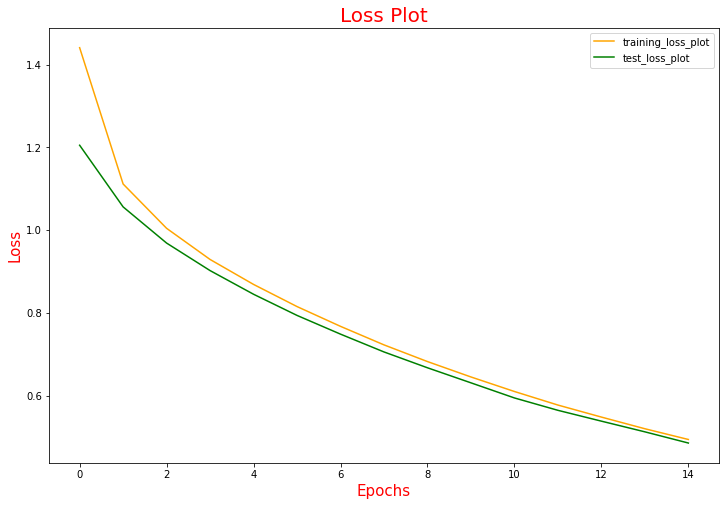

In [322]:
from matplotlib.pyplot import figure
figure(figsize=(12, 8))
plt.plot(loss_plot, color='orange', label = 'training_loss_plot')
plt.plot(test_loss_plot, color='green', label = 'test_loss_plot')
plt.xlabel('Epochs', fontsize = 15, color = 'red')
plt.ylabel('Loss', fontsize = 15, color = 'red')
plt.title('Loss Plot', fontsize = 20, color = 'red')
plt.legend()
plt.show()

Test Loss : Indicated by the green line, shows a steady pattern along with training loss (indicated by orange).

# Final Model Evaluation

1.Define your evaluation function using greedy search

2.Define your evaluation function using beam search ( optional)

3.Test it on a sample data using BLEU score

### Greedy Search

This method is a simple approximation technique which calculates the probability of the words according to their occurrence in the English vocabulary.

It takes the sample of the words, finds the probability of each of the words, and then outputs the word with the highest probability.

In [323]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_feature_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_images(image)[0], 0) #process the input image to desired format before extracting features
    img_tensor_val = image_features_extract_model(temp_input) # Extract features using our feature extraction model
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder (img_tensor_val) # extract the features by passing the input to encoder

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden) # get the output from decoder
        # attention_plot variable is a NumPy array that is used to store the attention weights during the evaluation or decoding process.

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy() #extract the predicted id(embedded value) which carries the max value
        #map the id to the word from tokenizer and append the value to the result list
        result.append (tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions


In [324]:
def plot_attention_map (caption, weights, image) :

  fig = plt.figure(figsize = (10, 10))
  temp_img = np.array(Image.open(image))

  cap_len = len(caption)
  for cap in range(cap_len) :
    weights_img = np.reshape(weights[cap], (8,8))
    wweights_img = np.array(Image.fromarray(weights_img).resize((224,224), Image.LANCZOS))

    ax = fig.add_subplot(cap_len//2, cap_len//2, cap+1)
    ax.set_title(caption[cap], fontsize = 14, color = 'red')

    img = ax.imshow(temp_img)

    ax.imshow(weights_img, cmap='gist_heat', alpha=0.6, extent=img.get_extent())
    ax.axis('off')
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  plt.show()

In [325]:
from nltk.translate.bleu_score import sentence_bleu

In [326]:
def filt_text(text):
    filt=['<start>','<unk>','<end>'] 
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [327]:
image_test = path_test.copy()

In [328]:
def pred_caption_audio(random, autoplay=False, weights=(0.5, 0.5, 0, 0)) :

    cap_test_data = caption_test.copy()
    rid = np.random.randint(0, random)
    test_image = image_test[rid]
    #test_image = './images/413231421_43833a11f5.jpg'
    #real_caption = '<start> black dog is digging in the snow <end>'

    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test_data[rid] if i not in [0]])
    result, attention_plot, pred_test = evaluate(test_image)


    real_caption=filt_text(real_caption)      


    pred_caption=' '.join(result).rsplit(' ', 1)[0]


    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = pred_caption.split()

    score = sentence_bleu(reference, candidate, weights=weights)#set your weights
    print(f"BELU score: {score*100}")
    print ('Real Caption:', real_caption)
    print ('Prediction Caption:', pred_caption)
    plot_attention_map(result, attention_plot, test_image)

    # we will make use of Google Text to Speech API (online), which will convert the caption to audio
    speech = gTTS('Predicted Caption : ' + pred_caption, lang = 'en', slow = False)
    speech.save('voice.mp3')
    audio_file = 'voice.mp3'

    display.display(display.Audio(audio_file, rate = None, autoplay = autoplay))

    return test_image
    


# Model Testing

evaluation metric : BLUE SCORE (Bilingual Evaluation Understudy)

## Test Image 1

/opt/conda/lib/python3.7/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 

Corpus/Sentence contains 0 counts of 2-gram overlaps.

BLEU scores might be undesirable; use SmoothingFunction().

  warnings.warn(_msg)


BELU score: 40.8248290463863

Real Caption: man talks on cellphone

Prediction Caption: man is talking to the background


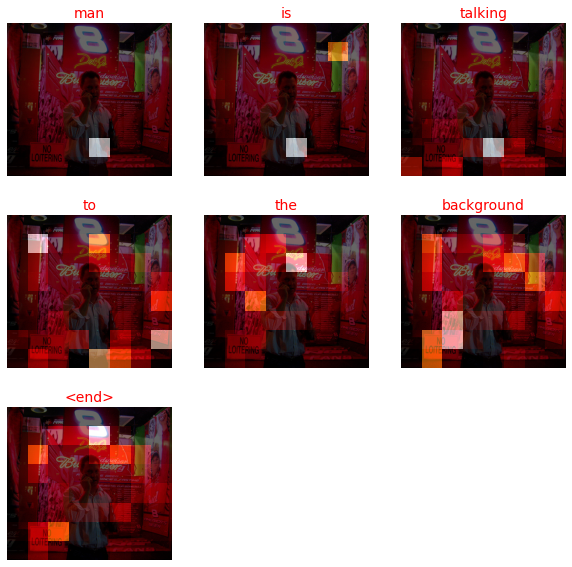

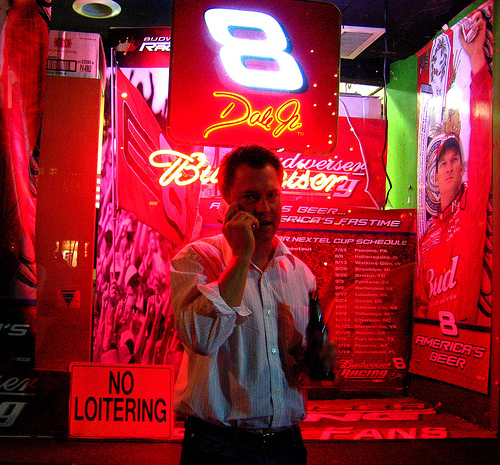

In [329]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

## Test Image 2

/opt/conda/lib/python3.7/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 

Corpus/Sentence contains 0 counts of 4-gram overlaps.

BLEU scores might be undesirable; use SmoothingFunction().

  warnings.warn(_msg)


BELU score: 23.887730262255293

Real Caption: UNK dog jumping in the air with tennis ball in his mouth

Prediction Caption: brown dog jumps in the air


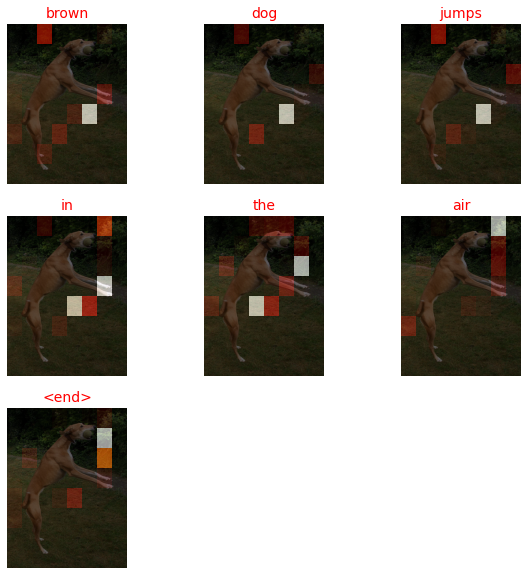

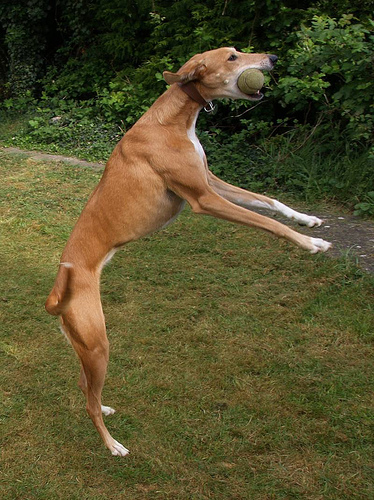

In [330]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

## Test Image 3

/opt/conda/lib/python3.7/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 

Corpus/Sentence contains 0 counts of 2-gram overlaps.

BLEU scores might be undesirable; use SmoothingFunction().

  warnings.warn(_msg)


BELU score: 42.51076653594019

Real Caption: two kids are playing with box of legos

Prediction Caption: two boys play with legos


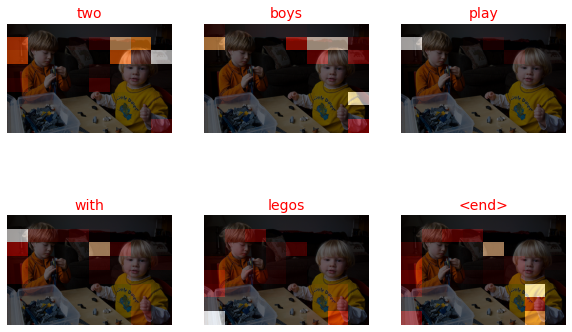

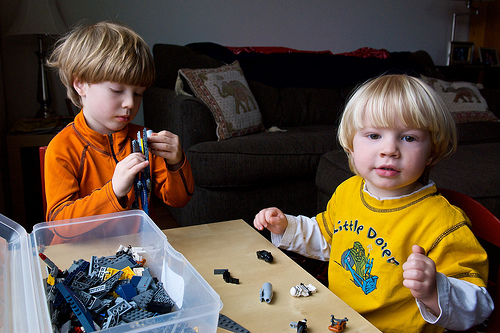

In [331]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

## Test Image 4

/opt/conda/lib/python3.7/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 

Corpus/Sentence contains 0 counts of 3-gram overlaps.

BLEU scores might be undesirable; use SmoothingFunction().

  warnings.warn(_msg)


BELU score: 77.77213055243143

Real Caption: snowboarder jumps into the air

Prediction Caption: snowboarder jumps in the air


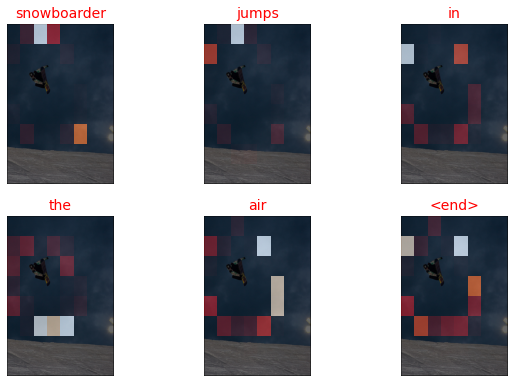

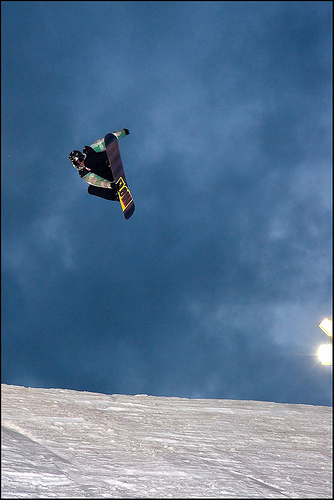

In [332]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.35, 0.25, 0, 0))
Image.open(test_image)

## Test Image 5

BELU score: 0

Real Caption: person is dirt biking over rocks and water

Prediction Caption: man on motorcycle steers through swampy stream


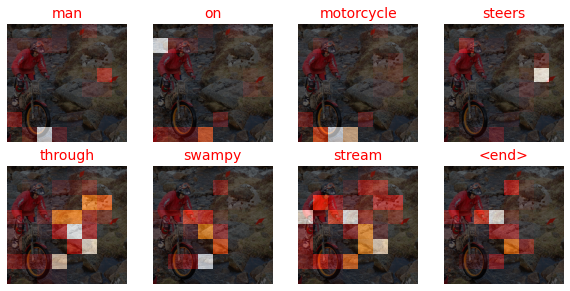

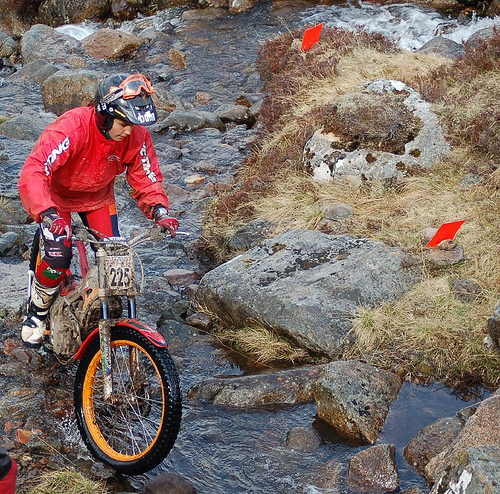

In [333]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.5, 0, 0))
Image.open(test_image)

## Test Image 6

/opt/conda/lib/python3.7/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 

Corpus/Sentence contains 0 counts of 4-gram overlaps.

BLEU scores might be undesirable; use SmoothingFunction().

  warnings.warn(_msg)


BELU score: 35.104358299585094

Real Caption: two boys play with shopping cart in parking lot

Prediction Caption: boy pushes shopping cart with shopping cart


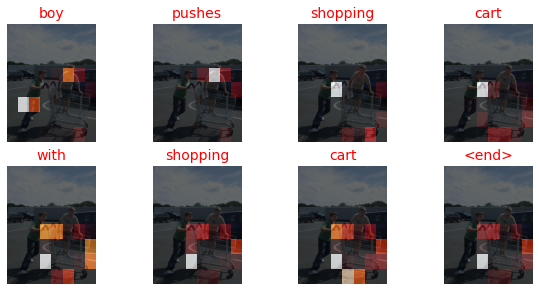

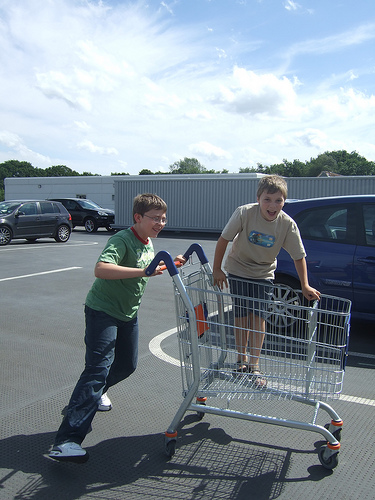

In [334]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.25, 0.5, 0, 0))
Image.open(test_image)

## Test Image 7

BELU score: 68.34466815318615

Real Caption: two dogs UNK each other in the middle of field

Prediction Caption: two dogs are standing next to each other in the grass


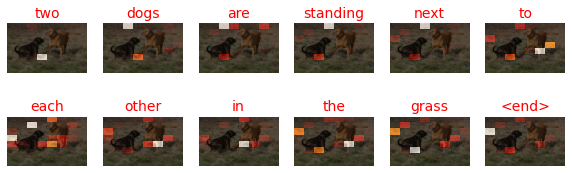

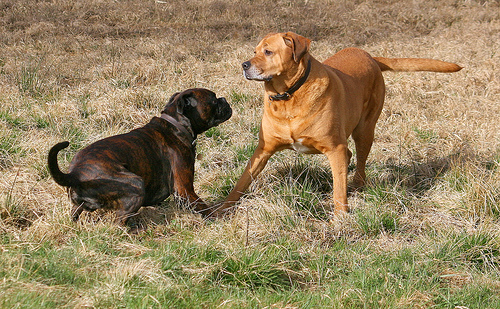

In [335]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.25, 0.25, 0, 0))
Image.open(test_image)

## Test Image 8

/opt/conda/lib/python3.7/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 

Corpus/Sentence contains 0 counts of 2-gram overlaps.

BLEU scores might be undesirable; use SmoothingFunction().

  warnings.warn(_msg)


BELU score: 26.089939795640397

Real Caption: man holds onto ropes and is pulled through the water on his ski

Prediction Caption: man wearing red waterskiing in harness waterskiing


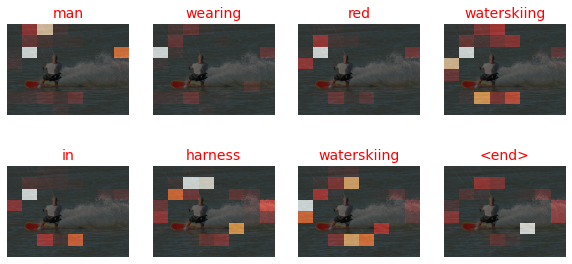

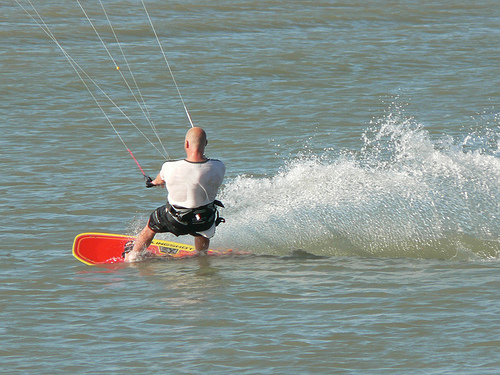

In [336]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.25, 0.5, 0, 0))
Image.open(test_image)

_________________

# Using a InceptionV3 + GRU Model (without Attention)

In [49]:
# Load the pre-trained InceptionV3 model
base_model_inception = InceptionV3(weights='imagenet')
model_inception = Model(inputs=base_model_inception.input, outputs=base_model_inception.layers[-2].output)
# summarize
print(model_inception.summary())

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_94 (Conv2D)          (None, 149, 149, 32)         864       ['input_6[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 149, 149, 32)         96        ['conv2d_94[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, 149, 149, 32)         0         ['batch_normalization_94

In [ ]:
# extract features from image
features = {}
directory = "/kaggle/input/flickr8k/Images"

for img_name in tqdm(os.listdir(directory)):
    # load the image from file
    img_path = directory + '/' + img_name
    image = load_img(img_path, target_size=(299, 299))
    # convert image pixels to numpy array
    image = img_to_array(image)
    # reshape data for model
    image = np.expand_dims(image, axis=0) 
    # preprocess image for vgg
    image = preprocess_input(image)
    # extract features
    feature = model_inception.predict(image, verbose=0)
    # get image ID
    image_id = img_name.split('.')[0]
    # store feature
    features[image_id] = feature

In [50]:
#open
import pickle

# Specify the path to the saved pickle file
pickle_file_path ="/kaggle/input/folder/features_inceptionv3_with_top_layer.pkl"

# Open the pickle file for reading in binary mode
with open(pickle_file_path, 'rb') as file:
   
    features = pickle.load(file)

In [62]:
with open("/kaggle/input/flickr8k/captions.txt", 'r') as f:
    next(f)
    captions_doc = f.read()

In [63]:
# create mapping of image to captions
mapping = {}
# process lines
for line in tqdm(captions_doc.split('\n')):
    # split the line by comma(,)
    tokens = line.split(',')
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    # remove extension from image ID
    image_id = image_id.split('.')[0]
    # convert caption list to string
    caption = " ".join(caption)
    # create list if needed
    if image_id not in mapping:
        mapping[image_id] = []
    # store the caption
    mapping[image_id].append(caption)

  0%|          | 0/40456 [00:00<?, ?it/s]

In [64]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            # take one caption at a time
            caption = captions[i]
            # preprocessing steps
            # convert to lowercase
            caption = caption.lower()
            # delete digits, special chars, etc., 
            caption = caption.replace('[^A-Za-z]', '')
            # delete additional spaces
            caption = caption.replace('\s+', ' ')
            # add start and end tags to the caption
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
            captions[i] = caption

In [65]:
# preprocess the text
clean(mapping)

In [66]:
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [67]:
# tokenize the text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index) + 1

In [68]:
f=open("/kaggle/input/glove6b/glove.6B.200d.txt",encoding="utf-8")
embeddings_index={}
for line in f:
    values=line.split()
    word=values[0]
    coefs=np.asarray(values[1:],dtype="float32")
    embeddings_index[word]=coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))
    

Found 400000 word vectors.


In [69]:
len(embeddings_index)

400000

In [72]:
embedding_dim = 200

embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in tokenizer.word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector
    
    

In [73]:
# get maximum length of the caption available
max_length = max(len(caption.split()) for caption in all_captions)
max_length

35

In [74]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
test = image_ids[split:]

In [75]:
# create data generator to get data in batch (avoids session crash)
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    # loop over images
    X1, X2, y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n += 1
            captions = mapping[key]
            # process each caption
            for caption in captions:
                # encode the sequence
                seq = tokenizer.texts_to_sequences([caption])[0]
                # split the sequence into X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pairs
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    
                    # store the sequences
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size:
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0

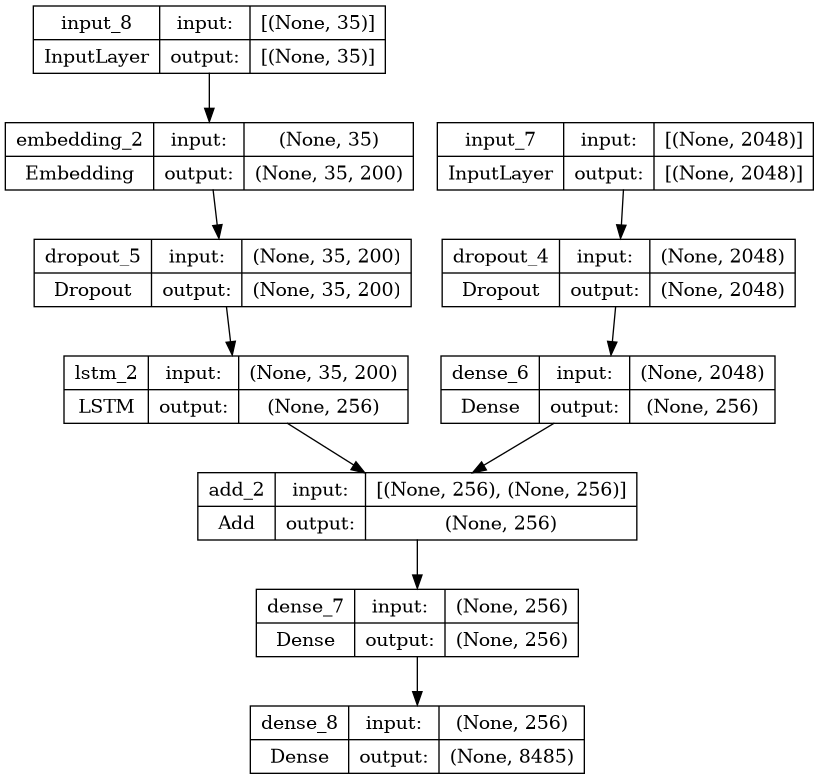

In [76]:
# Encoder model
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

# Sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size,embedding_dim, mask_zero=True,weights=[embedding_matrix], trainable=False)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)  # Change LSTM to GRU

# Decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam')

# Plot the model
plot_model(model, show_shapes=True)

In [77]:
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 35)]                 0         []                            
                                                                                                  
 input_7 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding_2 (Embedding)     (None, 35, 200)              1697000   ['input_8[0][0]']             
                                                                                                  
 dropout_4 (Dropout)         (None, 2048)                 0         ['input_7[0][0]']             
                                                                                            

In [ ]:
import matplotlib.pyplot as plt

# Lists to store training loss values
loss_values = []

# Train the model
epochs = 20
batch_size = 32
steps = len(train) // batch_size

for i in range(epochs):
    # create data generator
    generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # fit for one epoch
    history = model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    
    # Append the loss value to the list
    loss_values.append(history.history['loss'][0])


    
# store features in pickle
pickle.dump(model, open(os.path.join("/kaggle/working/", 'Inception_model_2048_embedding.pkl'), 'wb'))

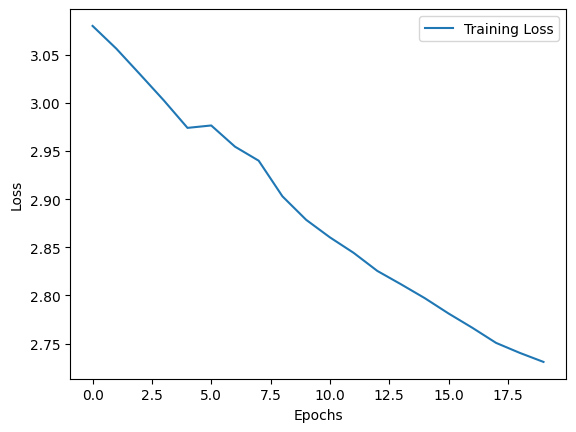

In [86]:
# Plot the training loss
plt.plot(loss_values, label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [78]:
#open
import pickle

# Specify the path to the saved pickle file
pickle_file_path ="/kaggle/input/folder/Inception_model_2048_embedding.pkl"

# Open the pickle file for reading in binary mode
with open(pickle_file_path, 'rb') as file:
   
    model = pickle.load(file)



In [79]:
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

In [80]:
# generate caption for an image
def predict_caption(model, image, tokenizer, max_length):
    # add start tag for generation process
    in_text = 'startseq'
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([image, sequence], verbose=0)
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        word = idx_to_word(yhat, tokenizer)
        # stop if word not found
        if word is None:
            break
        # append word as input for generating next word
        in_text += " " + word
        # stop if we reach end tag
        if word == 'endseq':
            break
      
    return in_text

In [81]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

for key in tqdm(test):
    # get actual caption
    captions = mapping[key]
    # predict the caption for image
    y_pred = predict_caption(model, features[key], tokenizer, max_length) 
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)
    
# calcuate BLEU score
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))

  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1: 0.415605
BLEU-2: 0.175896


In [82]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
    # load the image
    image_id = image_name.split('.')[0]
    img_path = os.path.join("/kaggle/input/flickr8k/Images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------Actual---------------------')
    for caption in captions:
        print(caption)
    # predict the caption
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print('--------------------Predicted--------------------')
    print(y_pred)
    plt.imshow(image)

---------------------Actual---------------------
startseq "a black and brown dog chasing after bull in fenced muddy area ." endseq
startseq bull runs from an aggressive dog behind him endseq
startseq dog chases bull through muddy pen endseq
startseq small black dog chases large animal in fenced area endseq
startseq the dog barks madly at the bull in the pen endseq
--------------------Predicted--------------------
startseq two dogs are playing in the grass endseq


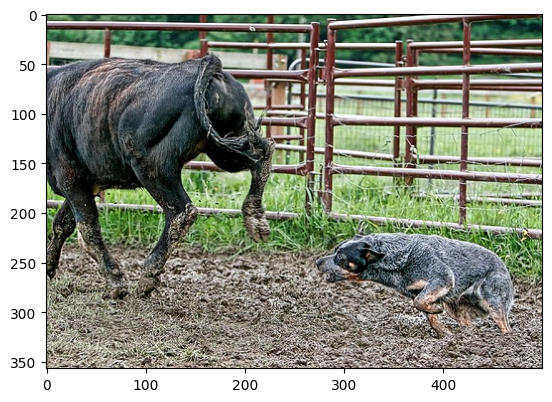

In [83]:
import random
for x in random.sample(test, 1):
    generate_caption(f"{x}.jpg")


In [3]:
l=[[1, 2, 3],[4, 5, 6],[10,11,12],[15,16,17]]
l[:,1]

TypeError: list indices must be integers or slices, not tuple